In [1]:
from Bio.PDB import PDBParser, PPBuilder, is_aa
from Bio.SeqUtils import seq1
import torch
import py3Dmol
import numpy as np
from utils import *
from models import *
from data import *
from visualizations import show_overlay_pdb_vs_pred
import os
from tqdm import tqdm
import wandb

device = "cuda" if torch.cuda.is_available else "cpu"
print(f"Using device {device}")

%load_ext autoreload
%autoreload 2
    
from preprocess import preprocess_dataset

Using device cuda


In [ ]:
preprocess_dataset("pdbstyle-2.08", "train_encoded", "test_encoded", batch_size=16, workers=12, skip_above_length=400)

Processing:   0%|                                                                          | 0/35494 [00:00<?, ?file/s]

In [5]:
data = np.load("train_encoded/d12asa_.ent_chainA.npz", allow_pickle=True)
print(data)

NpzFile 'train_encoded/d12asa_.ent_chainA.npz' with keys: sequence, coords_ca, esm, original_path


In [3]:
# Test kabsch alignment
coords = torch.tensor([[[0,0,0], [0,0,1.0], [0,1.0,1.0]]])
preds = torch.tensor([[[0,0,1.0], [0,1.0,1.0], [0,1.0,0]]])
mask = torch.tensor([[1.0, 1.0, 1.0]])
print(kabsch_align_batch(coords, preds, mask))

tensor([[[0.0000e+00, 5.9605e-08, 1.4901e-07],
         [0.0000e+00, 0.0000e+00, 1.0000e+00],
         [0.0000e+00, 1.0000e+00, 1.0000e+00]]])


In [6]:
minibatch = torch.tensor(data["esm"], device=device).unsqueeze(0)
mask = torch.ones((1, minibatch.shape[1]), device=device)
truth = torch.tensor(data["coords_ca"], device=device).unsqueeze(0)
print(minibatch.shape, truth.shape)

torch.Size([1, 327, 1280]) torch.Size([1, 327, 3])


In [ ]:
global_scale = compute_global_scale("train_encoded")
print(f"Global scale: {global_scale}")

In [4]:
global_scale = 10.614584922790527

In [3]:
train_loader = create_loader("train_encoded", batch_size=1, shuffle=True)
test_loader = create_loader("test_encoded", batch_size=1, shuffle=False)

In [5]:
embedding_dim = next(iter(train_loader))[0].shape[2]
print(f"Embedding dim is {embedding_dim}")
model_config = {
    "in_ch": embedding_dim,
    "base": 64,
    "depth": 4
}

model = UNet1D(**model_config).to(device)
print(sum([para.numel() for para in model.parameters()]), "trainable params")

optimizer = torch.optim.Adam(params=model.parameters(), lr=1e-3)

Embedding dim is 640
8570627 trainable params


In [14]:
embedding_dim = next(iter(train_loader))[0].shape[2]
print(f"Embedding dim is {embedding_dim}")
model_config = {
    "d_in": embedding_dim,
    "d_x": 256,
    "d_p": 128,
    "depth": 5
}

model = MiniFold(**model_config).to(device)
print(sum([para.numel() for para in model.parameters()]), "trainable params")

optimizer = torch.optim.Adam(params=model.parameters(), lr=1e-4, weight_decay=0.01)

Embedding dim is 640
1336195 trainable params


In [6]:
epochs = 30
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max = epochs
)

In [5]:
def save_model(name, config, model, epoch):
    os.makedirs("checkpoints", exist_ok=True)
    checkpoint = {
        "epoch": epoch,
        "model_state": model.state_dict(),
        "config": model_config
    }
    torch.save(checkpoint, os.path.join("checkpoints", f"{name}.pt"))

In [7]:
step = 0
log_every = 1000  # every N batches

wandb.init(project="minifold", config=model_config)

for epoch in range(epochs):

    model.train()
    train_running_loss = 0.0
    log_acc_loss = 0.0
    pbar = tqdm(train_loader, desc=f"Training epoch {epoch+1}/{epochs}", leave=False)
    for i, (esm_pad, coord_pad, mask_pad, seqs, origs) in enumerate(pbar):

        esm_pad = esm_pad.to(device)
        coord_pad = coord_pad.to(device)
        mask_pad = mask_pad.to(device)
        
        optimizer.zero_grad()
        
        preds = model(esm_pad, mask_pad)
        preds *= global_scale
        # Kabsch align
        preds_aligned = kabsch_align_batch(coord_pad, preds, mask_pad)
        
        diff = (preds_aligned - coord_pad) ** 2
        diff = diff * mask_pad.unsqueeze(-1)
        loss = diff.sum() / mask_pad.sum()
        loss.backward()
        optimizer.step()

        train_running_loss += loss.item()
        log_acc_loss += loss.item()
        
        avg_mse = train_running_loss / (i+1)
        avg_rmse = np.sqrt(avg_mse)
        pbar.set_postfix(loss=f"{loss.item():.4f}", avg=f"{avg_mse:.4f}", rmse=f"{avg_rmse:.4f} Angstrom")

        step += 1
        if step % log_every == 0:
            log_acc_rmse = np.sqrt(log_acc_loss / log_every)
            wandb.log({
                "train/step": step,
                "train/accumulated_rmse": log_acc_rmse,
                "train/lr": optimizer.param_groups[0]["lr"],
                "train/epoch": epoch+1,
            })
            log_acc_loss = 0.0
        
    model.eval()
    test_running_loss = 0.0
    pbar = tqdm(test_loader, desc=f"Testing  epoch {epoch+1}/{epochs}", leave=False)
    with torch.no_grad():
        for i, (esm_pad, coord_pad, mask_pad, seqs, origs) in enumerate(pbar):
    
            esm_pad = esm_pad.to(device)
            coord_pad = coord_pad.to(device)
            mask_pad = mask_pad.to(device)
            
            preds = model(esm_pad, mask_pad)
            preds *= global_scale
            # Kabsch align
            preds_aligned = kabsch_align_batch(coord_pad, preds, mask_pad)
            
            diff = (preds_aligned - coord_pad) ** 2
            diff = diff * mask_pad.unsqueeze(-1)
            loss = diff.sum() / mask_pad.sum()
            
            test_running_loss += loss.item()
            
            avg_mse = test_running_loss / (i+1)
            avg_rmse = np.sqrt(avg_mse)
            pbar.set_postfix(loss=f"{loss.item():.4f}", avg=f"{avg_mse:.4f}", rmse=f"{avg_rmse:.4f} Angstrom")

    test_rmse = np.sqrt(test_running_loss/len(test_loader))
    print(f"Epoch {epoch} train RMSE: {np.sqrt(train_running_loss/len(train_loader))}, test RMSE: {test_rmse}")

    wandb.log({
        "train/step": step,
        "train/test_rmse": test_rmse,
        "train/epoch": epoch+1,
    })
    
    # Save checkpoint
    save_model(f"upt_epoch_{epoch}", model_config, model, epoch)

    scheduler.step()

wandb.finish()

wandb: ERROR Failed to detect the name of this notebook. You can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: k12213391 (k12213391-johannes-kepler-universit-t-linz) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Epoch 0 train RMSE: 10.327698887720317, test RMSE: 9.172428089689916


Epoch 1 train RMSE: 8.694877866227873, test RMSE: 8.513653787466284


Epoch 2 train RMSE: 8.116959503569483, test RMSE: 8.310581823486961


Epoch 3 train RMSE: 7.763183324064275, test RMSE: 8.080433096607642


Epoch 4 train RMSE: 7.5091683053283065, test RMSE: 7.8243385204286175


Epoch 5 train RMSE: 7.308103886457289, test RMSE: 7.789825420122592


Epoch 6 train RMSE: 7.142314631587085, test RMSE: 7.613880339221469


Epoch 7 train RMSE: 7.001038575650114, test RMSE: 7.530518792325084


Epoch 8 train RMSE: 6.8660707115364765, test RMSE: 7.4927269341557325


Epoch 9 train RMSE: 6.7424814784366465, test RMSE: 7.441359398408422


Epoch 10 train RMSE: 6.6267557195599, test RMSE: 7.347774340312535


Epoch 11 train RMSE: 6.519403031935688, test RMSE: 7.295548490362347


Epoch 12 train RMSE: 6.409425695467508, test RMSE: 7.2599746127916305


Epoch 13 train RMSE: 6.305168954598399, test RMSE: 7.192321949577609


Epoch 14 train RMSE: 6.203875691724897, test RMSE: 7.119171407102964


Epoch 15 train RMSE: 6.102479951786302, test RMSE: 7.0831759199438835


Epoch 16 train RMSE: 6.009028269584623, test RMSE: 7.047003156904481


Epoch 17 train RMSE: 5.908002743219117, test RMSE: 7.016600246028558


Epoch 18 train RMSE: 5.816194543002178, test RMSE: 6.9716178437406375


Epoch 19 train RMSE: 5.721017061539813, test RMSE: 6.9536325570121145


                                                                                                                           ] 

Epoch 20 train RMSE: 5.635047129503254, test RMSE: 6.93179602447209


Training epoch 22/30:   4%|▍         | 1275/30413 [00:58<20:46, 23.38it/s, avg=29.9507, loss=8.2909, rmse=5.4727 Angstrom] IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

Training epoch 24/30:  11%|█         | 3388/30413 [02:34<18:14, 24.69it/s, avg=29.3927, loss=8.9467, rmse=5.4215 Angstrom]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

Testing  epoch 25/30:  34%|███▍      | 1136/3313 [00:14<00:25, 86.25it/s, avg=48.1830, loss=37.4976, rmse=6.9414 Angstr

In [10]:
print(f"train RMSE: {np.sqrt(train_running_loss/len(train_loader))}, test RMSE: {test_rmse}")

train RMSE: 5.17811636874396, test RMSE: 6.857186194706147


In [9]:
save_model("upt", model_config, model, optimizer, 1)

In [12]:
torch.cuda.empty_cache()

In [28]:
checkpoint = torch.load(os.path.join("checkpoints", "upt_epoch_0.pt"), map_location="cpu")

model_config = checkpoint["config"]
model = MiniFold(**model_config)
model.load_state_dict(checkpoint["model_state"])
model.to(device)

MiniFold(
  (embed): Linear(in_features=1280, out_features=256, bias=True)
  (pair_proj): PairwiseProject(
    (lin): Linear(in_features=256, out_features=192, bias=True)
  )
  (tri_blocks): ModuleList(
    (0-5): 6 x TriangleMulUpdate(
      (left): Linear(in_features=192, out_features=192, bias=False)
      (right): Linear(in_features=192, out_features=192, bias=False)
      (out): Linear(in_features=192, out_features=192, bias=False)
      (norm): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
      (drop): Dropout(p=0.1, inplace=False)
    )
  )
  (res_blocks): ModuleList(
    (0-5): 6 x ResidueUpdate(
      (pair_to_res): Linear(in_features=192, out_features=256, bias=True)
      (mlp): Sequential(
        (0): Linear(in_features=256, out_features=256, bias=True)
        (1): ReLU()
        (2): Dropout(p=0.1, inplace=False)
        (3): Linear(in_features=256, out_features=256, bias=True)
      )
      (norm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
    )
  )

In [12]:
def predict_test_set(out_dir):

    os.makedirs(out_dir, exist_ok=True)
    running_idx = 0

    model.eval()
    pbar = tqdm(test_loader, desc=f"Predicting test set", leave=False)
    with torch.no_grad():
        for i, (esm_pad, coord_pad, mask_pad, seqs, origs) in enumerate(pbar):
    
            esm_pad = esm_pad.to(device)
            coord_pad = coord_pad.to(device)
            mask_pad = mask_pad.to(device)
            
            preds = model(esm_pad, mask_pad)
            preds *= global_scale
            # Kabsch align
            preds_aligned = kabsch_align_batch(coord_pad, preds, mask_pad)
    
            for i in range(preds_aligned.shape[0]):
                np.savez_compressed(
                    os.path.join(out_dir, str(running_idx)),
                    sequence=seqs[i],
                    preds=preds_aligned[i][mask_pad[i]].cpu().detach().numpy(),
                    truth=coord_pad[i][mask_pad[i]].cpu().detach().numpy(),
                    original_path=origs[i]
                )
                running_idx += 1

In [29]:
predict_test_set("test_preds_epoch1")

In [39]:
data = np.load("train_encoded/d12asa_.ent_chainA.npz", allow_pickle=True)
seq = data["sequence"].item()
coords = np.array(data["coords_ca"], dtype=np.float32, copy=False)

def random_rotation_matrix():
    H = np.random.randn(3, 3)
    Q, R = np.linalg.qr(H)
    if np.linalg.det(Q) < 0:
        Q[:, 2] *= -1
    return Q

R = random_rotation_matrix()
coords_rotated_translated = coords @ R.T

In [59]:
coords_rotated_translated[:, 2] -= 10
show_overlay_pdb_vs_pred("pdbstyle-2.08/2a\d12asa_.ent", seq, coords, coords_rotated_translated)

<>:2: SyntaxWarning: invalid escape sequence '\d'
<>:2: SyntaxWarning: invalid escape sequence '\d'
C:\Users\sebik\AppData\Local\Temp\ipykernel_186472\4255362326.py:2: SyntaxWarning: invalid escape sequence '\d'
  show_overlay_pdb_vs_pred("pdbstyle-2.08/2a\d12asa_.ent", seq, coords, coords_rotated_translated)


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [36]:
def visualize_predicted(dir="test_preds_epoch30", nr=20):
    for i in range(nr):
        data = np.load(os.path.join(dir, str(i) + ".npz"), allow_pickle=True)
        seq = data["sequence"].item()
        preds = np.array(data["preds"], dtype=np.float32, copy=False)
        truth = np.array(data["truth"], dtype=np.float32, copy=False)
        orig = data["original_path"].item()
        show_overlay_pdb_vs_pred(os.path.join("pdbstyle-2.08", orig), seq, truth, preds)

visualize_predicted()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

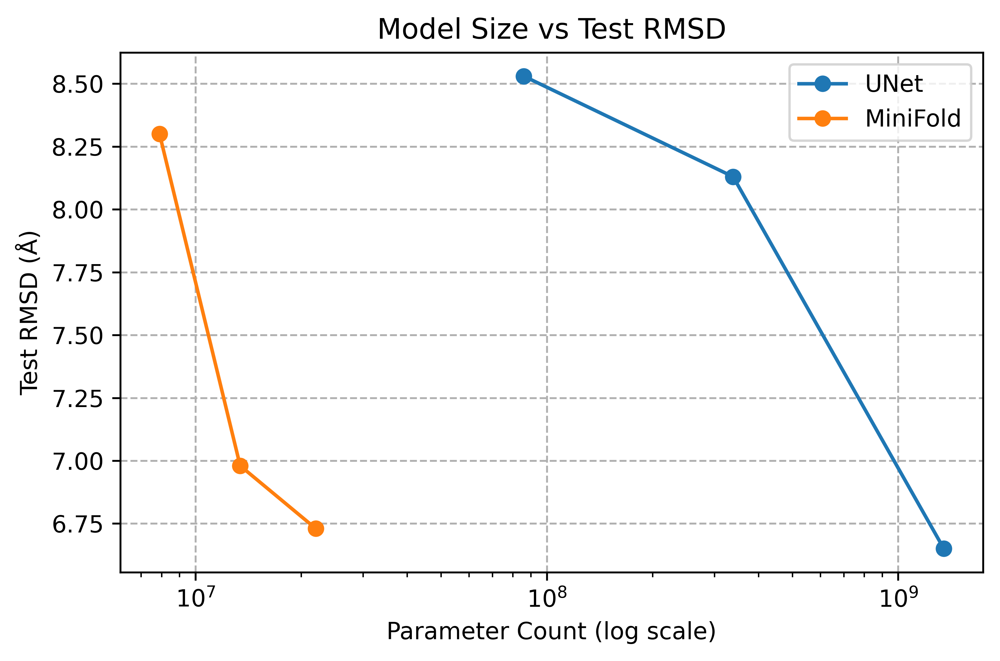

In [29]:
import matplotlib.pyplot as plt
import numpy as np

# Data from tables
unet_params = np.array([8.6*10e6, 33.9*10e6, 134.9*10e6])
unet_rmse = np.array([8.53, 8.13, 6.65])

minifold_params = np.array([0.79*10e6, 1.34*10e6, 2.20*10e6])
minifold_rmse = np.array([8.30, 6.98, 6.73])

plt.figure(figsize=(6,4))
plt.plot(unet_params, unet_rmse, marker='o', label='UNet')
plt.plot(minifold_params, minifold_rmse, marker='o', label='MiniFold')

plt.xscale('log')
plt.xlabel('Parameter Count (log scale)')
plt.ylabel('Test RMSD (Å)')
plt.title('Model Size vs Test RMSD')
plt.legend()
plt.tight_layout()
plt.grid(linestyle='--')
plt.savefig("fig.pdf")
plt.show()